In [1]:
# Only to get data from kaagle in google colab
#  ! pip install -q kaggle
# from google.colab import files
# files.upload()
# !mkdir ~/.kaggle
# ! cp /content/kaggle.json ~/.kaggle
# ! chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d valentynsichkar/yolo-coco-data
# !unzip /content/yolo-coco-data.zip

In [61]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from urllib.request import urlopen
from PIL import Image
import random
from matplotlib.pyplot import figure

In [7]:
#Load Yolov3
weights='/content/yolov3.weights'
configuration='/content/yolov3.cfg'
classes_names='/content/coco.names'
yolov3 = cv2.dnn.readNet(weights,configuration)

In [8]:
# Get classes
classes = []
with open(classes_names, "r") as f:
    classes = [line.strip() for line in f.readlines()]

In [9]:
len(classes)

80

In [11]:
classes[:3]

['person', 'bicycle', 'car']

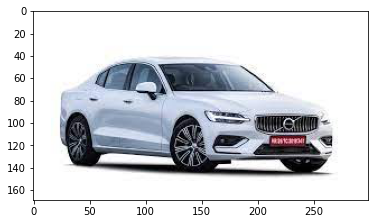

In [150]:
# Load image
img = Image.open(urlopen('data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBYVFRUVFhYZGRgYGBgaGhgcHBgcFRkaHBgaGhwaHBwcIS4lHCEsIRgYJjgmKy8xNTY1HCQ7QD00Py40NTEBDAwMEA8QHBISHjQrJCs0NDQ0NDQ0NDQ0NDQ0NDQ0MTQ0NDQ0NDQ0NDQxNDQ0NDQ0NDQ0MTQ0NDQ0NDQ0NDQ0NP/AABEIAKkBKwMBIgACEQEDEQH/xAAcAAEAAgMBAQEAAAAAAAAAAAAABAYDBQcCAQj/xABHEAACAQIEAgYGBgYIBgMAAAABAgADEQQSITEFQQYTIlFhkQcyQnGBsRRSkqHB0SNDcoKy8BYzRGKi0uHxFRdTg4STJFR0/8QAGAEBAQEBAQAAAAAAAAAAAAAAAAECAwT/xAAfEQEBAQADAQADAQEAAAAAAAAAARECEiExA0FRFAT/2gAMAwEAAhEDEQA/AOzREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERA+RPl7SHX4nTXQtr3cz7hziS01OiV6v0roLoWUHuZsp/xWkcdL6R0zp8HQnyDGa61ntFpiV5OkKEXLWX6xBVftMAv3yYmMv7TDyP4R0p2jaRNU1Vvrn4gfnMTY229YD7I/GOtXY3UTSf8AFEG+IT7VP859HF6f/wBmn9qn+cdabG6iaheKUz/aKf2qf5zMnEFP6xD8Rf7mjrTY2USKmKB7j7jeZOtHcf590mKzRPCsDsZ7kCIiAiIgIiICIiAiIgIiICIiAiIgIiICInlmAFybCB9ms4pxilh1LOwFvEfzzA+InnF469wu33nlbwnK8XjTiKr12bMiE9XzXKLgOPeLtfucDlOnHhv1jlyz42fE+mVavUZKQKKqhixFm19UBdwTYntd1ipvNNUoVKlwzMwbU5ycpPfl9XyE+cCp/oXxDetVYuPBT2Vtf+6AfiYc33M7cZMcuVtqJxLD9SlwQGJCqALC5/KaThq9ln+ubL+yug+/MfjJXH8QdRckIjED+8wt8pLwmByqidwUeW/4x9q/I+Yag6dtXZGte63DW8SCDLF0U6Q3OR+QJYaBWTdmy7Bl1Y5bZlzEgsATrMctkbvOnnpNPQZqbq6GzIwYHuI1H+0WM8az9KODHDYkpe6OC1MsSwy39XfUqez7ih3JmsXDkck+yZfuKYMY7A9gdukBUpAHW1iDTv8Auug/YRjvOXYXFurgFiwOmuuhtYju5GYvjo2nWZTYqvkLSRTxAPsqfgJq8TWMy4Udog7ZL+dhfzNo0bNSfZPwP5zYYdxlF7q3foVPytNBh682eFxQzLpzEsqVZ+FVbCzhDrodCZZMNUsAQLAi4sSPlOfmvkfQ6aEe7f8A0lj4bxDMMl9wWT8VlvqauVDE39pvtE/OeamNxFAmooOJpE3NPsjEJ3mmxstQf3Gs29mOizRYfHTbYbGzHLi1OSwcL4pSxCdZRcMtypGoZWG6up1VhzUgGbCUnFcMzP8ASMO/UYiwu4F0qgbJWT218dGHIza8C4/1zmhWTqcSouaZN0ddusot7aeTLsQOfK8cdJdWGIiRSIiAiIgIiICIiAiIgIiIHyeXYDUm09St167NUc3NgxUeAU2/CXjNqW43VTGKNtflNZicSW9Y2HdyEjlja5Y+c9I99mv8dJ1nCRi8tealIMCp2IIO40IIO3gTtKnxXoaTSdMO+TMpAV7lVuLaMNQLd4Y+MseK41QpPkqVkRyLhWOW48CdOYk6lVVwGUgg8xYjzGhm0Uh+D1lUIEsqgADMuw20LSI/C6w/Vufct/4bzo4tPjAGOzPVxDGYGoWGem65qq3zIy9kMGO42tcS49GaFJ3d6rIMtsqMwGYm9za+oA/il8ZFG9h5CQuKcHo4lMlZFdb3AJIIPepBBU6nUd8mriThq6AWTIB3JlA+6afpnhEqYZ3YDOmUo9u1qwBW/cb7TScS9HuEKt1aNTqAXR+sqtkYag2ZjzAlK6O1630hsLW62o9yrK9SqyoFN84Aa3d62huCLbGftf03vRbja08U2HLaBQw8CVvUW/7IR/8AtEc5XOmnDfomKchRkf8ASJfYKxNwP2XLC3cyy64XoNSWqMQHcOGDWB0JvqGzFyQdtLaEy5VKKnKeYvvsQdx8jfwizSV+fFrqfWcH3FR85Kp1k0PWr2QVFyt7EHTQ67md8WineB7wJkGFU7ZD+6v5R1VwBGpj9anmJIpYpF9tCe/MJ3f6F/dX7I/KfThbboPIflA4a+LRrEOt/wBoSfgMfbZ1upDDUb852Vaacxb4CSEw6HbKfgt43ExzAcVpEhhUQZhcrnW4PMHWTsNxNOTof3l/OdFODT6q/ZWeTgU+on2FjsdVWw3E0NrOu2vaEk4qlSxKqrMQyHMlRWAq025Mjcj4bHYgib1uG0/qU/sJ+Uw1uCUH9alSO41pIdDYkbeA8hM7GsQeDcdqLUXC4rL1h0p1l0p4gAdw/q6lt0PjluNrWpvK7/R3DXv1SDwVFX49mbKmWW9jvqb3PIDn7hMWfxqNlEirie8eUyrVB5yYrLERIEREBERAREQERED5KuGBd9fbe/2jLRKGtQiuzey2ZvDKbkffOn4/2zW4zWnw1JyrpD6Rm6xkwyq4U2ztmKtbfKqkaeJMn9FenJqOtGugR30VlJKMbarY3ym22pvt3X3OU+M5XQa+HR7Z0VrbXAM9iqFFhYAbDYCRGxGh8OffNViKxY7y4mrEMQO+exWEq6oe+e1dhsfvMuJqbW4IjPnWtWS5BKrUfJuToCbDebhLAAX279T8ZX1xD9/3z2uLcfyJMNb1wDMQwq3uBY9/OaxOIsNx8xMy8RjKuxPVNfcL/E/7HznsyFRxdyfh8pJV5THrIJ96kSvdIOluHwujv2iLhFGZz42Gw8SQNJqeE+kTC1mClmpsTYdYAoJ/aUlR8bTPYxeFUjZj5zKmJcb6yIlS4uJA4QrPUr0nrOjq+ZSOrt1bsShVWUjLuh53Q995aRv1rBvf3c58ZAZWcVgOJqwC5HW5OcBBbU2t2lJ0C8tbkbbwBxXiqBy+DuQ1kCK7Zhr2iUdgvLv35TPn6aXQFhsfhynpa/eLfKUJOmeKUsKuAZALdotUXfwaly56ywcI48mIzKA4dQCyEIDlOzrZjmU/WUkctDpGIsHWTyakiVMQEUmxPgLZjz5m2wJuTbSVx+nmEHtDn7VNthc+o7bDWFW01fGOt8ZSm9IGF5NfbYVjuuYerSO4BPuF5j/5hYbSxvcqBpiNS18oH6DnY277SbFyryK3jPYqyhD0i4Y213sBpiNc18tv0Ot7G3ukjCdPMNUIC3a4votci1yMxJpAAXB1Omhk8PV6WueRkha55iUJOnmE+v3c1A1BIN3K8gT8JteE9LsNWYIlRczbDPRZvso7H42sOczZCLerA7T1IOEr5i1tQDa+ov3ix7u+TploiIgIiICIiB8nFelXGWTBVApsSMqtzAc2IB91z4GdqnAfSA18PSW1v0yg+4K83wvlZs+Kdw3CCy3bLmZEvlzHM3qi1xy1OvntMmNw+Qko+bK5XNbKyspGwufA3BPjY6T0ruCEYEarUp92ZbMw15/ge60yuzEOii6t1tR23H1kN+RJAHjYQrp/BOJ/SMPTqc2XtDuYaMPtAiTUGt5TvRti1NN6btlCVM1+5XW4GnirTp+FqUbAI6eYv986y+OVnqv1Fb+dPnMWUy3lAeQMxPhUO6jyl0xVQTPYeWJ+GoeVvcZgqcHXk3mPyjTGmFUz2tQcxJdThDjaxkarhHXdTKjyjWJI2uPkJ84zxoUMPVqt7K6Da52A+JIHxmNWsSDzA/GVT0g4rLRppfVnLW7wi8/AMyn4CTl8WfVFrsXZq2IJZ2OYrt7rnkANAo2FtpJXAVnAC0sqt6oORM9x7IcgvfvF5m4Q9KnVpCsod3swzkdXTzaoHGt8+mYn1VYEdrabxWjkxqVlJYOrnMdy6UyATcDtEBGbuYuPZnF1XP0ccVq5Bh66sLKr0nYHKyMAQubYkAqRrfKw7pcsXgg7I4dkqJfK65c1jbMhDAhlNhcEcgRYgGcn6PUX+nNXVstNG6sqDYsiDqlB5ZQELfugDUiddFTQGdON8YrVcZ4BVxFQVevVWChTZHGbLftG1WwbxA5CQaPR7HI10xbEaXU1KyDTnswF/dN7juKpRTO7Ko72YKL+8zWJ0uonapR+NVYGCpg+Li2TFAfvK/8AHTAmwwOBxrC+Jq0nt6q9VRc/tFsii57gNO8z4nHw3qlG9zg/IzK3Fn+qPvkxdRON0Xp4cqrH19SQLZXYhkAGgFnsANtJxqphH1bcE12P72HDi/7pv8Z2nFYjrUZHFgwtcHtDmCL8wQDKhjOiL5s9Nye1mIsGU3VkPYdlsMrW0c7aKLATPKLK5+1B8psp3H34YsB9m8+JhyWRW7AaphULc1DUrX8iTLivAXRlFStSRb08xZMSrEJSak1g1MKxZG5NbxmKvw6wyJiMIq9gMTXcVXRFyFGY0hYFQosoA01zXmcaYcTxgpiDQp1aYwyP1a4Rqb5WQMFAY5CS7etnuSGNwdpreMEh61Okgp0VdylMXI7NF6gLMbs52ILE2sLWE2tDAPdGevw9nXKOsNUioQNCMwTewADbjkYo8JIyhsVgzYID+nc5stJ6RP8AV8w4+zFlMVqphmVGNj6tvs4ZbfdUJ+M3XR3BH6bhhbarXsNfYRUUfCyzc4Loy1VWX6TSYEKrGmlWpb/4/UHdVVbgBrltwJaOE9H6dGoKpzu92bM7C4LEFgFTsJqq/WJtvEiLC6Y5aiBGp9SO0VCqjNrqruzMRfclVufCWnDsSova9hexJF+diQL+Urn/ABG29gPE2+c3HCMQHViCCL20NxtJRsYiJFIiICIiB8nCvShh2QvSYWC1RUQ2tmpsGAseeUuAT4TusrvTvha4jA4lSgZlpVGp3ALB1UlcvcSRb4yy4lfn4pVyN1iLlQXuWCsq37JygEj+6bAE95krFP8ARwiU1N2VVrFjcAsTp2bWIVspB2Oltp94bVC/pW1JZVw6H1AzAXcjmRc3Ym5ynWQ+JkKQ1MnIUdSbknMHbUtzJDAeNvC42y2Ho/qnrqqfWphvsuB8nMuLuQbHcTmPBeKvhqoqp3FW2Jykgm1+dwD8JcP6dFrBmpuBsGpofmomuPKSYnLj63v0hh6pIPgSJIpcSrra1R/ixI2PfNNheNvUF0wyOp5pSrAedNwJ7qcRt62Hy/vV1/jzTXaM9astDj1cbsG94X8JPp9IH9pFPuJH5ykpxykTs3uWqn405JHGKPIVB/63+TLLsPV3TjqndCPcQfymdeL0juSPep/C8oycWpfXf40vxVz8pmXilL/qIP2lqr8kMnh6teIajUzdtQdgbgHa+x33nI+lp6zHpRY3VAiNY6ZT23IP7Lb+Al3p4um17VaZufrkcgPbUSgca7HEb6MHamLDKwZWQU2GjqPrD1l94k5fGuP1DqY6hXAD3UiwXMSWUX2WsASyjktRTYbOJOUO+XDqRUrKVdG0JJUFurYKSobKH9ojTkWJMivjsFRbKtJWYEAIqJU7XcSygg8uy7ydhsU5roy0KNMOrmoqDNiURMuds+XRriwC6ZgVNyGA5yNWtbUFZFagFKVyzNUa1smdi2gBLFiuXRb7qd1vOsYKrnpo2uqqdQQdQDqDYg67EXnLnqJiWJxIKVaqpkZXYdYlhlDWLAtbLplvlK2Q3E6F0dsMPTUWIUFNMtuwxW3ZZhy7/eAdBvj9Tk5v084v12KZM3YpHIADpmHrt773X9weMr2IWnnshJSw1YjNe2uunynSsHhMNhmrUsTSc/pGdK/0cVRURzmGZurezrcqRtp4zOX4OfWemv7WGpIf8VASWauubYHhr4hxToIXY/EAd5I0UeJInS+BdE3oLl692rgepTIFGncC3WMym/f2gSQdFNrzaYDifDqa5KeMpU0JuVQ0Kd/eVQEe8WPiJZsBiMPkXqnQoblSjKVNzqbjck3ue+WSJdYKPBwFXO5LhRmYDKpa2pCkmwvyuZD4risPhQpq1gma4UMQL2tf4C48xPXSnpHTwdHrG7TMcqIp1d7XsT7IA1J7trmwnFeMcTfEu9St67Ed5VVF7Kq2sq66fE6kkyW4SLZxzFYTFYsGpUVqS0AFZTcBzU2JG3ZBvIdbA4AJUZXuVLlFDm7AFCoItoSCwG/O97aU1UK3yuRfkAdfunh2e/rufcP9px5Tbr2/i/6Jw4yYvY4fw8u3bAS3Z/SNmvn2IyaaXG50APPTGuA4fZLuRdVLEsxYNnXs2VbarmueWhA5ynL4u/k34CGY8nfn3/iJOrr/AK+P8dA6K8RwmGfEk1FRWWhYE9tsqOzlQbXsWP5850qhw5KtIVKNYMHS9N7Arrsf5Gndyn50pO2YFlZrH2gux0NzuBbulv6D9M3wVU02VjhWa5QEsaZPNOdvD/cbnkx4vycu3K3+s3SvhNfDVi9V2eg5ZQ5ZlZH3FN7EKptbuuNQTub36I8pw+JZPUOJYL2g5IFKnqSDa57h/rN/xLHYUqr1KqKrhRqFIcEZlUq6kMRqRpca+MmcAakUZqIIVn1Jp9WWYKq5suVbiwUXtyhlt4iJAiIgIiICeSLz1MdRL8yPcbQPzV0u4Q2Axb0WzCkrNUoH2WR72HvX1Se8HvErtfFXUKCSoZm7rkknb4/zefpjj3RDD4xQtbO1r5SXJK33tfaVPE+hvCN6tSovkfwl1McJZ52H0O8AopTfFYgIWqWFJXCkqim5ex2zNa3gl+ckJ6F6YN+vZhyBtb5SRiPRrX9nFP8AaPlCulLjKewdbe8T2MUn1x5icfr+jzHD1cQ5/eMgVuhfFF2r1PtGB2yp1TesEb3hT85Ar8BwTm74bDMe806ZPna84pV6P8WTarU8zItTDcXX9ZV8/wDSB2qr0O4e39npj9ksv8LCQ6no9wB2R191aqf4mM4w+M4sv6yt935TCeP8VX9bW8h/ljanjsNX0ZYU7VsQv79Mj/FTJ++UT0ldBPotFMTTqPUVWCVMwUFFY9lrjlmNvewlY/pVxQfr6vkv+WY6/S7iLqyPVdkcFWVkQqykWIPZjaY+0MTTIqYmxLhQaltMpbs9gjUZ2uS+mRSQO0yyb0fxLChiK5tnfMF0AC9TT6xFUDZbBltsAtpVKNR0YMuZSOYvfxHiPDnJycdcDJlTLYgrlKqbrUUmyEWJFVtrbL3a2UxNp0fpGGVF7TpdRfKDmAJte/tUwAP/AM5HOT+H9JjRtSeo7hV/rQSTmv6o5soFgGOtweVrVipjiUKKqopIJVRoxF7FmYlmtc6E2EjZ/OXcMdCp9NkG1Sr8A35z0fSAg9ut9/4tNX0I4lw3DZqmMotXqNoFKI1FFvvZj2mPfbTYc5daXTjgY2wNNf8Axqf4LHanWNtheGY2rSp1kyutREdbuAcrqGF7g62Ink8L4uNFp0QPGtp5BJmo+ljhwAUF1UAAAIwAA0AAA0EkJ6WOHH9Yw96VP8snamRpsZ0d4xVUq64VlNrqzK6m2ouGpEGa4dAeJf8AR4cP+3S/CjLpT9JvDj+vA94YfMTOnpD4cf7TT+Jt85Nq4pC9A+J/UwA/dX8KM1XSng2NwFIV6tLDOhbKTSRTkJ2LZqS2B2v32HMX6kvT3h5/tVL7S/nPmI6U8Oro1N8RQdHUqyl1IYHcHWNHAqfSupyp0V96Jr5JJdPpDXKM98MuX2GRQ7DSxXs2b3A3nvpb0PSizPg6yV6JuQodTWTwK37Y7iuveO+nlmW66jvGo+6NFtw/SPEsj1AKARLXzKoLEgkBRzOm08U+lNW+tCmfEJT/ABQyo3ll6O9FMdjGUUaT5T+sbMtEDvLHQ+4XPhGjoXRPpXXxlanhytQMxJLKy5VQes7WItbbbUkDnOu4egEUKL2HMm5PiSdzK90K6I0+H0ioOeq9usqkatbZVHsoNbD4mWiQIiICIiAiIgIiICIiAiIgIiIHmwnk0l+qPITJEDA2FQ7ovkJhbhlE7018hJsQNW3AcOd6S+QmFujGFP6pfKbqIGhfolhDvSXyEjv0IwR3or5CWaIFSf0fYE/qV8hMR9HOC5UwPhLlEClH0cYP6gmNvRnhD7MvMQKCfRdhO6eT6LML3ToEQOeH0VYWYz6J8L3zo8QObn0SYXvM+r6JcLzJnR4gc5/5S4SZR6KsJ4zoMQKGvovwf1TJlH0f4ZbZWqC3czD5GXCIGhwnRlE2qVv/AGVP803FKiFFrsfeSfnM0QEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQP//Z'))
img=np.asarray(img)
plt.imshow(img)

In [151]:
img.shape

(169, 299, 3)

In [152]:
# preprocess image
blob = cv2.dnn.blobFromImage(img, 1/255 , (416 , 416) ,(0,0,0) , swapRB=True , crop=False)

In [153]:
blob.shape

(1, 3, 416, 416)

In [154]:
height, width, channels = img.shape

In [155]:
yolov3.setInput(blob)

In [156]:
# defining output layer
output_layer_name=yolov3.getUnconnectedOutLayersNames()
layeroutput=yolov3.forward(output_layer_name)

In [158]:
# find the bounding boxes
boxes=[]
confidences=[]
class_ids=[]
for output in layeroutput:
  for detection in output:
    score=detection[5:]
    class_id=np.argmax(detection[5:])
    confidence=score[class_id]
    if confidence >0.7:
      center_x=int(detection[0]*width)
      center_y=int(detection[1]*height)
      w=int(detection[2]*width)
      h=int(detection[3]*height)

      x=int(center_x-w/2)
      y=int(center_y-h/2)

      boxes.append([x,y,w,h])
      confidences.append(float(confidence))
      class_ids.append(class_id)


In [159]:
boxes

[[14, 43, 264, 101]]

In [160]:
# eliminate the dummy predictions
indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

In [161]:
indexes

array([[0]], dtype=int32)

In [162]:
# display the predicted objects 
def plot_image():
    font = cv2.FONT_HERSHEY_PLAIN
    colors=[random.uniform(0,255) for i in range(len(boxes))]
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
    
            label = str(classes[class_ids[i]])
            color = colors[i]
            confi=str(round(confidences[i],2))
    
            cv2.rectangle(img, (x,y), (x + w, y + h), color, 1)
            cv2.putText(img, label+ " "+confi, (x, y + 10), font, 2, color,2)
          
    plt.imshow(img)
    plt.show()
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()

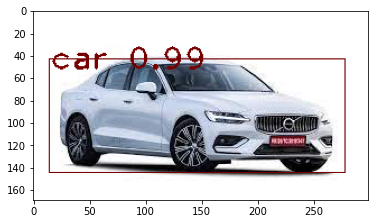

In [163]:
plot_image()

In [184]:
# function for detect objects from images
def detect_object(url,shape=(20,10),accu_score=0.6,box_width=1,text_size=2):
  img = Image.open(urlopen(url))
  img=np.asarray(img)
  height, width, channels = img.shape
  blob = cv2.dnn.blobFromImage(img, 1/255 , (416 , 416) ,(0,0,0) , swapRB=True , crop=False)
  yolov3.setInput(blob)
  layeroutput=yolov3.forward(output_layer_name)

  boxes=[]
  confidences=[]
  class_ids=[]
  for output in layeroutput:
    for detection in output:
      score=detection[5:]
      class_id=np.argmax(detection[5:])
      confidence=score[class_id]
      if confidence >accu_score:
        center_x=int(detection[0]*width)
        center_y=int(detection[1]*height)
        w=int(detection[2]*width)
        h=int(detection[3]*height)

        x=int(center_x-w/2)
        y=int(center_y-h/2)

        boxes.append([x,y,w,h])
        confidences.append(float(confidence))
        class_ids.append(class_id)

  indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)


  font = cv2.FONT_HERSHEY_PLAIN
  colors=[random.uniform(0,255) for i in range(len(boxes))]
  for i in range(len(boxes)):
      if i in indexes:
          x, y, w, h = boxes[i]
  
          label = str(classes[class_ids[i]])
          color = colors[i]
          confi=str(round(confidences[i],2))
  
          cv2.rectangle(img, (x,y), (x + w, y + h), color, box_width)
          cv2.putText(img, label+ " "+confi, (x, y + 10), font, 2, color,text_size)
  print(f'No of object detected = {len(indexes)}')
  figure(num=None,figsize=shape)       
  plt.imshow(img)
  plt.show()



  

No of object detected = 4


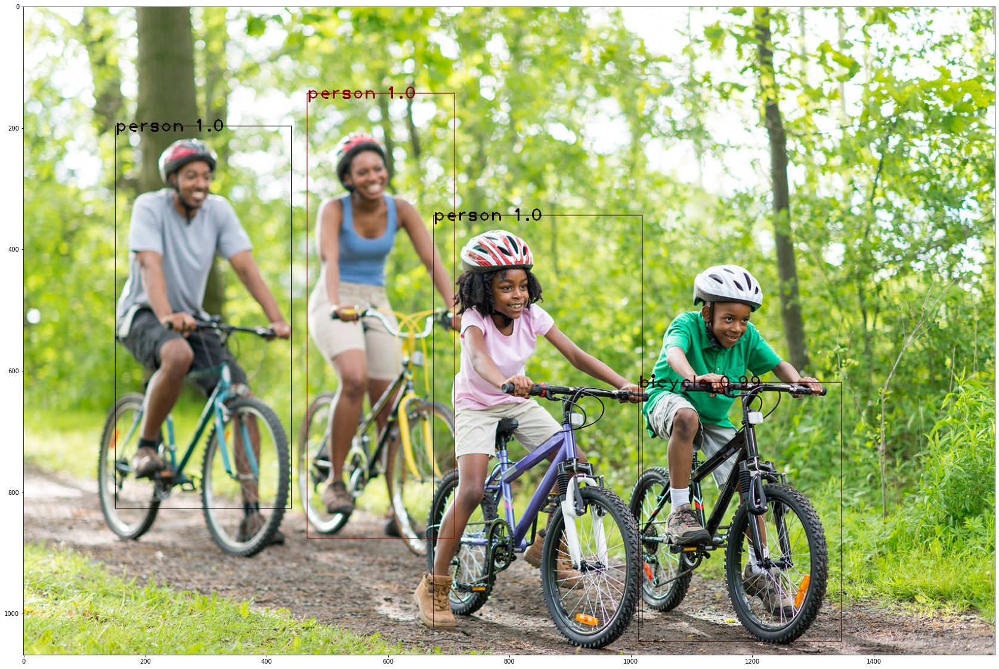

In [178]:
detect_object('https://cdn.britannica.com/63/82563-050-3FCFC72A/Family-country-road.jpg',(30, 20))

No of object detected = 22


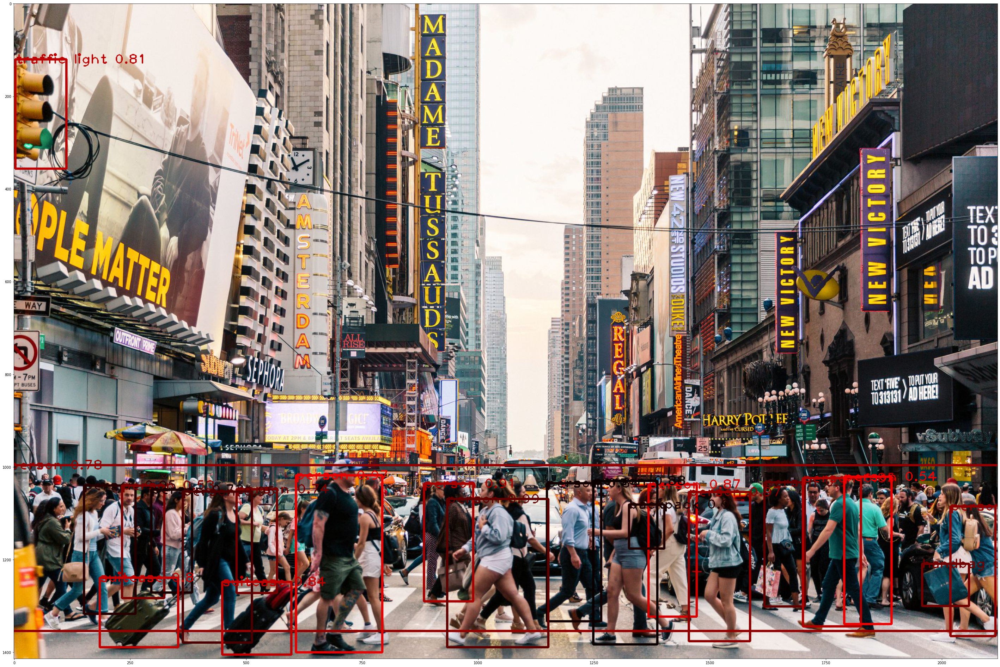

In [193]:
detect_object('https://www.tripsavvy.com/thmb/d6H37gfPqlZNc8dlBZwXn7QuDIQ=/2121x1414/filters:fill(auto,1)/crowds-of-people-crossing-street-on-zebra-crossing-in-new-york--usa-1161240357-8611563635fb4c9cb95b0cb66c34b85e.jpg',shape=(50,50),box_width=3,text_size=2,accu_score=0.5)

No of object detected = 2


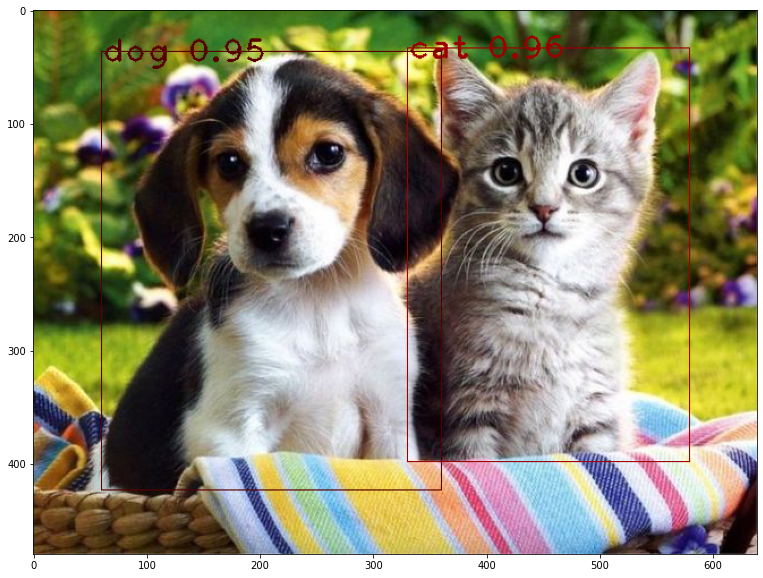

In [194]:
detect_object('http://www.petsworld.in/blog/wp-content/uploads/2015/05/dog-kitten.jpg')

No of object detected = 2


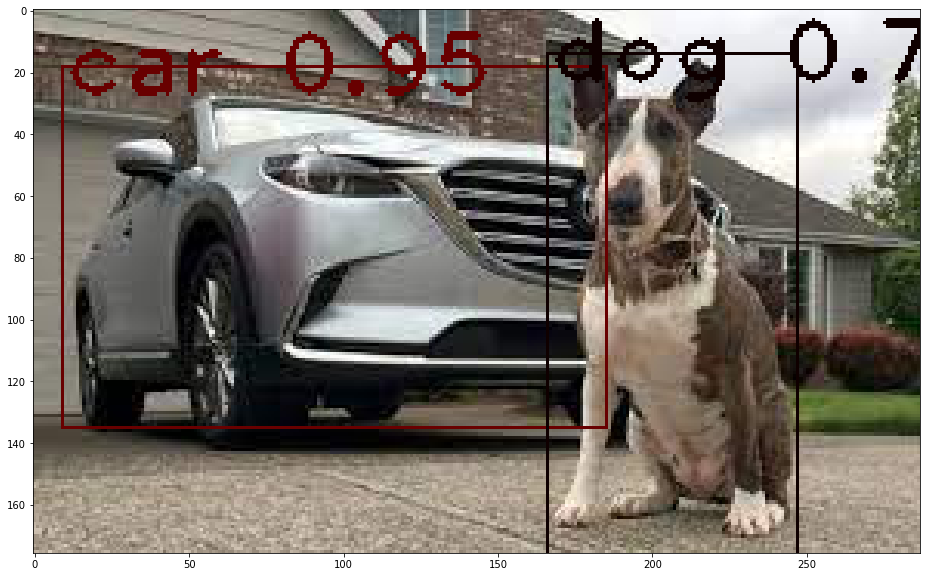

In [195]:
detect_object('data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoHCBYWFRgWFhYZGRgaHBwcHBwcHRwjHhwcHhocGhweHB4fIS4lHh4rIx4cJjgmKy8xNTU1HCQ7QDszPy40NTEBDAwMEA8QGhIRHDQhISE0NDQ0NDQxNDQ0NDQ0NDQ0NDE0NDE0NDQxNDQ0MTQ0PzQ0NDQ/PzQ/NDQxNDQxNDE0NP/AABEIALABHwMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAAFAQIDBAYHAAj/xABHEAACAQIEAwUFBAcGBQMFAAABAhEAAwQSITEFQVEGYXGBkSIyobHBE1LR8AcUQmJykuEVI4KistIWM1XC8UNTsxclVKPi/8QAGAEBAQEBAQAAAAAAAAAAAAAAAAECAwT/xAAhEQEBAQADAQABBQEAAAAAAAAAARECEiExQQMTIjJRUv/aAAwDAQACEQMRAD8AKpaVhKPP8Lz9TTlsOP2p/iA+kVz+/as5QUY5iZaUIKx38xTrN119y+46AO8ekxXJu8W+yuOSnzI+hpCx5ofgfrWRscTxQ2vFtveVTr4lZ+NWl4/il95bb92VgfUNHwpp1aF3TZtPEGPlFeWyh92P8J/ChFvtQNnsMD+6wI/zRUw7QYY+8HX+JJ/0zVMoi1g8nYeh+YJpcr/unyI+pqrb4lhm928o8WK/AxVy2A3uXA3gVagjZm5r6EfWKidhzBHlPymrT23H3SPAg/WmmeanyI/pRA97SNtHkYoXjsBM0fcA7g+YP4VWeyh2jy0oM7wriVzCPI9pCfbTr3jo1bLH4S1jrS3LbDN+y0equN/wrOY7ATQ7h+Ou4R8yaoffQ7MPo3fWonxDfw7I7I6wyyCJ7vlRfsqBnujrh7vyFaPFYezj7Oe2Rnj2W5q0e643ju9KCdnsK1vEujjK32F0EeSwQeY761rGKSW99Rt39R1p2MTLh2n76dOj99Wks76jb6jrUXELcYdv40/7x9avL4nD+wVbkiPKTsBy1jT1qR8KUO889IMiTrMnpUYHuxoebE6Hxnb1qwLDmYGYLE5dYMHnrXF6UNls0CBPLWB8TFFsDxDE4Ygozquhy+8hG+u417oNCb5dASgKORppruJgHQ6d1U043eU+0qN/hyn1QitRjl9dU4V2+tvpeQoZjMvtJ4n9pfjWww95HUOjKynZlII9RXAsJ2iVnYXk9n9jKA22855kcxEUY4dx+2jZrV42z4OgPiBmQ+Yq6w7WRTJrIcJ7YB8qMPtGMAMjIST3qCPgK1Afnt3VqCzmpC9V89JNaRaD01rtV5pM1QSlzXg9RZq9mqix9pTXeoM1NL0E2am56hL0k0HDVSf2jExy335iplfQKSpG2oE1GuHdTLIw1005R40jNrMHcxp41wx12JEwuoOUjWZEjnuI3qS/ZYgEZjJiZmT561KW9lBpEQBJ8aQjLEE7AjzqYuoEVlWNo7tT6Hu+NebWQVUkDcmPLXnUrOw1MT4V5r5OhA3qqWx+rFYdHQgGWUysnYxM+OlQ2cJYcanK0jlpHMzyq5w/BNemAAJ1J/8AGtSY/DWLL5c7h1ifZUANv7JLAMuxq5We0hljCuin7LFEZQSRmaIBjYyNRBjvpV4niVmLgeBMMq/QKaha/aaSbpkmdUTpGuVvzrSFbZOlxDrMlWB88oNTKdpVlO0N7ZraN4Fl+pqcdoQR7dhx/Cyt8DFD3wYOoYf4X/3gVPb4e5kySI0IUPJ6ewxI8aemcVscRwx5lPFXHxAiquJW0/u3EP8AiH11qvdt5WCtlE/eDLHjoaYyLIlSFMzlIYjw2pp1ipg8a+Fvl7eoIGdeTrJ9D0NdBwmNt4lFvW4zhSpn3kzAB0b4egNc745gyoQ2g3tGJygaxMTTOCm2rg3XeOZQCQQDEeca+NalZsbG/g2tsyErOXkapcSEYd/4k/1R9aROI23JJugkjdswO0CSwHzr2Oj9Xcgq2qEQyn9tek1vlfHPjxs5A2UEA8z3jp5U9rGozaAjv7+41GFIykjpE7H5Ur5ZnLHWDv384rk9Czh7pZ0VnZgsgAmQNOWvcKXi+FUI7gaqpPoKZhIzrB0nunY9+tWeKOCj2/vI8E9QpPyrXGTHHlf5RhkOgPStl2R7NpjnAzlFCZ2yiTIIBXXbffurH2HgEVsf0ccXXCNcuOGZGBVQu+aRrr4R5Vpqx1jg3Z3DYUf3KANEF21c+Z28ookxrM4Htkl1LjracLaUM2bLz0AAB1J19KGcX7cr9i/2SOtwqQhbLAJGh0OpHIdadpE60J/Sn2iEphrVzUEteCk6QBkQkeJJHctXP0cdrbuId8PfYOypnR4hiAQpDRodwZ33rlFuTLMZJJJJ1JJ1JPUnett+iqzOLd59y0w8SzoPoau+meOxZqQvVZrsVC9+tMrZevF6Hm9SG9TBda5TPtKqByanRDVE4cASTApi4lC2UMJiR3xvH551X4u2TD3HOXRT7wkdNuZ10HWK59hcY1kBw5WAYZt2BMe7Jy8/5a5cuXWjOK90bE+RI+tSDG3RvJ8TPzFFfsKb+rio1gaOINzUHxRfpTlx680X/MPkavnCjpUuEs4YGL2fwTL8SaT0UBi7R3Vh4P8AQiocViFy+wST+8BA8wda3GBwPCXgZXn99n/7SBQjtn2cw9m2L+GbQtlZCxbVtmUnXkAR3CIq3iSh3Y5z9o6kyY38D+BrqfCbaBiSikuFaYE+6EifFD61yHsk8X9BpkYE9ddCRy6eddNw3FFRV0kgEHwmRr/iarPiX61BRY90fCoHwlt9GRD/ABIp+YoK/HmPuoB4kn8Kibi1zcuF8APmaeoJP2awpOuGsz/Ao+Qqrf7J4M72FHgzr8mFUrfFFd8hxKydhnHnoNT4CpHtW0cZrmhB9vK2hHJpGkide6OlVMI/ZTDRCPct/wAN1o9GJFAOIdjb41s37dwfduIgP84Uz8K0dvFYQERjbOYHZnQGfAtRvDY1G2vW3/hKk/BjTIu2OVPwXEoRnsBlXb7K6sjwDMfgBVLF2VDHNbuJpBzoe/aJG0D1NdpuhGHtLm8VJ+lUb2Etna1J7vZHzHyqdWu1cZs8MUkQA6j3sjCY8PeXTmRUeJ4ZkAfWJjfvMggjQ12NuD2m95APU/Oor3ZbDuIIBEzy367b6n1qXis5uTOwCJBeeYPubfswR3elRq6kQVPiOvmOtdSv9i7DKFloGwztA8BtVG5+j+2dndf5T86nWr2jA4c+2kGddJ86JX7Wf+7I/wCYrKGjQEqd6047AAEEXiIPNZ+R+lIvZC6jhw6OojTYyPE1ZMjHL2yxye3w51Ll1yi2faHM9y9Z699IcSzgBRABAC6bR41s+0nDikq6hWgaCPIyPzpVLgfCA76CVSCx/PWpK3RxitnhRAWGuKM5O5LH6DasInEQGyNJXTXoevhXXcVwkXsMUbQnl0A2rlnEeD/ZXSrDbn1FSWHsU8RhAozKPZPQ7HmK6B+jrgr2lbEXAFNxAEXnlzZpbpMKQPlWYwlpVAzLnCspKk6NuYJHLaulcK7QYe9ALBH+6+mvRW2Na405CLSaaLBPKitvDirduyI2rfZzwBXCnpUiYQk0ba0I768toDep2XFO1w4QKsDBCphcFee4Ip2MZrtfjLdlbZcKVzGRElhEEDpod5HKuU4g50uCHASICxCDOAAwOvM7NudZrddvMTZuulp2VEA0uRm9ogHLA15DWsZhzkW5bAUsXAzMQNFWdQTrO4/8Vw5e0ooopMv50qaKQLW2kWUfkUC7Q8OvMQ9lhoPaXNlOkmQTp/4rR5B0oTx257K21MFyJPQbn4A+cdasKxYxeIQBitwCJBD8u7Q1fwfGLmIiz9o3Mw4B2H3lGnnRp8FPvaAbDw+lQYXBqrMwWGY7juEbVuMUd4Dw2xaR3e45uZSoywADoYymZkgayKPcPsuRLGem1YW/isnvPrrEbxT+G8YKMHtt/EvIjoRTw9dGKwKy3bDDsAL+R3thQpKAHIY9oONSBOoMRrvWp/XLL2kuKSc4kLOs7EHpB0oWcUUOZWIbu+Ucx3GqkjP9kOMWbb5zaXMBIZ2JyiQogBdzOpqXi/azNddJbRysa8jGlHLeHwl4/wB7YyOZ9uychM7yo0nvqDHfo9S42e3iiJ5OgJPiQVk98VPW7jLYnjyOgYhip9kyAQT0g91BWODcz7do9bYyn0Jit/e/R/eyIi3bGVCTrnEk8zoe/wBaD3f0a4gb3sP6v/sp6zsA+F4wJvjMaoG5RVIHmX28q3XCuJARGMxzjeD9h8mrPYbsRdturjE2QQeQfUcwfY2qXinCGtNnQgjdgmbKDzKyBH8MeE6gSyrsGO13bq5hlQWg7B5Adwg1GXN7g0gMD3z3Vhcbx577S+PI7lS6APz40efJeTJcTOFIfLMSQDqCNRoSDHIzyFZQYjBhiHw7iDBC5gQQYOpvEfCkuwsxatEn3Mfr3vl/1XJoitrHIJTFkj913b4IGoLdt8NbZr1s97EgeQtn51B/ZODb3MZHcyD5sy/KqjV2uMcVT3b+b+J1X4OVNW/+OOKWRL2w6jUnJmH8yEj41kLXCGH/ACcfb8M7KfRC1RcSs4m0qi5ezo5iZdttd3UH0oNVc7QtjwbjKockIFWYzCAsT1BFdBw1m3gsOFcgH3nb97oPkK592RbDlsOixnBzuCp1OZgkHoMoMd/OvdrO0TPde27EKrkBRtpoD31zvH3I68bM2ui8I47bvOUU+HeOsVj+34X7dUBiUBHmx/ChPY7Gg3/Z3KnXpG1XO2aM+ItFQWbJBjqGff1G9SzPF3fVPC2mdHKKzBILEawokEwOU1CrVBhr91M5sXCjKk5g0SQwZtekT6VLwa82KnKpN0bhQIc6n2QuzaHuq8Z4zy+jfBe0t/D+42ZPuNJXy5r5Vt+F9u7D+zdBtNoNfaQk/vAaeYFcuIgwRBG/UUgPSqy719tIkGR1GxqJrlcZ4fxS7YM23ZOo/ZPip0Na7hfbhTC30IPN0Er5ruPKasG3DV666wc20a89PCqGH4lbdM6Orj90ifAg7HxrOJ2lBdrakAguAX0WddDPhAAP4UtkRnOIvYuC7cQOotKTlZi0s0IpUDbqfGTMUGwyqtsBgczMTJgaBR+3qeYkdedH8YcK2cKkXXMZkeBmbfKAT7GsEAHfoJrF4xuR5GInQep7q5W4lbWK9kNLljr514L3x6Vts1zA1oXiSq5nMFt5MDwAnQcvSrONuEMFAkRqZG/SN6o4lFcQy5hvryI2I761IlOuPUQaAT0FIzVWx7xac90eulVGV4lxH2p3J+A5Cm4LH65o23HUUJuMWYnqau4bCa+97XT6VcHROzvEPZZCf3lPdz/HzohexFYrgGKhl7jlNaN7tVqQWwN32q1eGvaCsPgbntVpMPfgCichlr5HOo3vE86oPemlN4Aammub15JqjiE0IOx/PrUr8VtDTOpPRfaPos1E9/NqAY79KixncThyjSNjsdvhy7/XQGAI4vdS2gb9Wt3PaOZoAfXUFmyknnr37nlrr9oMIOs/DvHfQO5nsuDMCZBGnmDy+mncTm+XY3rJPxXCN72DA/huMfgCtKt7hzmCl233gmB6s5+FGcfxHGB/YQXlb2lIFzUcwVV8oYcwB37VWucZugf3vD1Pe1lR8WtE/GtIpNgOHnRMQ4/in/utKPjVPGcNtoua3dDxuJtTHUZbjMeWmWrNzimDY+3g8h55WYf5QyioxewDfs3U8Nvi7H4VQT7LcSVLiQPaJRe4qHzT3EAsI8PCpu0GBd7hdUnNzBHtde+qPDcNhs+e27llBYAz0jX+7A5/eo5dvi4hV4GXQZZjTSNZ11rnyuV04zeKDs5g7lt5yFVPMx1nxoz2m4wEUIpGdxBg6qvPzO1QfrqogAGUKIlueseeoPpQDEcVZC2VVfMZJcab9J2251z9tb+RY4Y5DokT9oQGH7m7eAgEedEuFcHawoe3muW7t20idFTMLl0kcnGVUnoSaFcJ4u7u7fZ25Cj3UjTOkiAdT8dK1j4Z7WGtl1KA3GKsDqNABPfvr0ArUuMcpsDcejPcdtDJ3zJJMDMSCZkmTVcYV/ut5CflRHHq9x0cOyaBXC7Eifag6SRE9Ymh+MxP2TZHczGbW2jaSRvAPKtMPfYuN0bxKmoXHWpmxICI+dArsyrNsgyuWfcb94VJbvOyM6OrBTGhurrBMe03dQ1FhsS6NmRyrdVMf+R3GrdjGguWvL9oGEHWDOsN3nU9OtA27RMDDWz/ADz/AKkNPHaZDo1n/Kh+SqalFx7eUhzczgrESVK8lnrG8baDuoficgBykGCNYjcTpI06aVPZ4xbfa0/8un/yCn3bVljotwHpsPWGFYsk/LNaoGo8TdCIWOkCpZbn8/6UI7U4gphnYcsvqWArbaL7YN7UzPOmO1C+EYotaRjvqD4g6/GiT+NbZRsaocbeLD+VXDQ/j3/IfyoMfYHPyHjV9bLRrIZdwRB79/zpVXC2sxVToCdzsCdBPTWK2Xaq9nt4V49r7BJ8gFIPowq2jPYa7Fw9+vnWlW/IrJK0Op74o/hn0FVZRzAXNaI8Y4+mGQHIXY6KJAB31+8QNpAjlNA7DxtudB+fCay/FsQbl1okgHIvPQaCPE/Ooch7DdoMViXhWyINwkSAdtd5n5GjeG4ap1clz++S3zNU+z/CnRBKHM2p09B5fjR1LDj9k+lREluFEKAB3aU43KYUb7p9KYwPQ0EhuVFdAYQRI/PpTHJr2sUA29g3Uyntr90/DQ6SOog91Ur9x1jLduWD0cZ1nuLgt860FMfXQiR0qdlxnTi8cNnS8Pz+yCvyqtd4sRpfwVst1yKp/wA6PWguYG2f2I/hlflUL4YgQLjx0bKwHkRTsmKGGCPaNxLS2w0rpk1iBuiqCMx6cqW2uXMrCA6h18Dz+db7hXAbV3DIXGstlj2QRI1gaTIb1oX2u4YEFplTKApQEcgCMgJ8Sa5W767Tzxl8MiuWDakLJk7x8qG3sPazRnIE6iJAHMA6Ubw3Bbq3WEGBKt4FT/SrmA7KLIZyxI1jYbiKaoNhU+yCvbmM6K0Ku2f22mJMRAHia3najKMLaGciGX2dDm3kzv1PnU2A4XbE+yImTpz3+dBu398D7JAeZMDwiaaz+QXG40qgdQYG53y8pPcaDYvGi4QSw6SRrz0HrV+zfgR3QRyI5+tCeKYRbbgr7p1A5AjQjXyI8a3KWJsffQ2bCQSUdySDA9rJA1HKK0HZ9B+qsddW7vuNWVz5lRQBo5JMSTOXu023761vAp/VDIj2/D9g8qrlZ/IExGBEJoPcT5VVu4QAE6aAn0FaHE2/c/gT/SKG4tfZbwPLuNAJs4gKu4EzBM6DnSfbaR9oZ3JgkeAEVXumBruAKQRud+c7/wBf6VzzWHTJoH2yE4S5/gP+daN6ch8aHdoFBw17Qn2CfTUfKukdWS4IsJkHUH1nf0nzFaE29KE4e/D2xvFhEMDmrMQY8CNatXMSeSuf8JrTKZkofxpZsOO75Gntff7j/wArfhVPiWIIQq6MuYEAkNr6igodk8WLV9SyhrbLkuK2xR9G8xuD1FFu0trI62YYfZlkXNuyG47oe/2TE91ZvAMqhi07CIHd47UdxuObEIjMzsbaBASV1RPZGm6xOupmZ56KM/iTBMcjRzCNoKC4oLmIAgaaDloO+reCxyrlBk7anQfOtJoxfvMoZkEsoyKN5d4zGO4R6Gi3ZjsXdYq7COk8v61OvZTEXrVrEYG4twjOHVGVXRyQSDmME79N+hpMvHrJgW7zqP3Ub/STUhXR+F8Ma2oBafKiyWx0Fco/4n4wnv4a552H+iGmn9IeOT38OB/Err80q6mOtlF6Ck+xTmo9BXJl/StcHvWLf85H0qUfpYP/AOOs9z/0ppldH4pfw1hDcvFEQczGvcBzPcK55jf0l4XMRbwbuPvMVWe8AA1geM8ZvYp/tL7lvur+yo6AbVSmlMb1v0k2eeAj/GP9tN/+omFO+DceDisDd1FQfZUV0X/jvAnfDXR4Mv8AupG7YYBhH2d9Sdvd39a50LVeyUsivoLs1iA+FtCdlIPiDr8aXiOKB9hoyjrz6Vmew/EM2G31DGR5D8DVriF3MYrz134+iVu8Pf3p/wCtZgQIBoHaJjQ1Kt4jWs6uLHFsS4tPlJBymCNDMcq5ulyd5nlJmtrxu4XtMA5SASY5gDaeVYBG1rUZsErTbCdZ+tOx1vOhGsjUeKj8JqnhiSfj6mB86Izy2M+lX4fVR+HstqyRMl3LacvYA7/XvrScETLhSp3D/wDYaxh4gZIIJIJG5691LZ4i4YHMfCfWau0vHhflbTFL7n8Cc/3RQvEoTp101oTjONu77kKoCiO4Rr5VB/ar8idaW0nDjntOxWEIDFmAK+6IJn02gayaGfaECDt59fCiycRlof2h+elR31R5Igd2vr4aVPXPl+l/zXQiByFVeJLNq5p+w/8ApNW4PSosSko46qw9QRWkYK3jirINFhWXOJBbXMAepAMT+FOu8Rfk7SO/1oXxbE5kReUlh5ogPyoPW8ZaN+J3P/cf+Y1UxWIZ/eZmjaSTHhNP7PcCbFFwHyBAJMTMztqOlaGz2FH7V9iZ5KBp5k60XGd4ZhkfPnfJlUlTp7TCIXzrVdkbMo1okRc0GYAgXHByE6SQcjCDzZTQLHcG+zxH2CuTKgqWiTIOmneIq1w5Jt3gGysqo6mYhkfSD110oA/GMObd50LZirspI5kEg/KqOWp8dfZ3d2MszFmPUkyT6mqjOetaZwTwHFb9kzau3EJ3KMyz4wdfOjdnt5xBdsU5/iyt8xWRLHrTgrEFuSxPnMfKmK3Nv9JfER/64Piif7asD9KfEObWm8bY+lc7zGkLmmGuin9J+KPvW8M3jbP+6or/AOkd3Uq+EwbAiDNrcfzVgkBJqw2DMSA/8tS5FaL/AIttf9Pwf8j/AEel/wCLLP8A0/C/y3P99Z9cEw2DHwG3qNTV7D4No95wehArN5SGUSPanD8+H4X0u/768O02G/6dhv8A9v8AvqmcG8++8f4Z+VI1pgffux/h/CmxetXT2lwv/TsP63f99Ie0eF/6dh/5r3++hWMLoAQ7HuaPwodiMWzeyTp41Z6jqXZvEq+GNy1YSwjMVKpnKtlHve0xMySOmlToMxOuo/P0pOzcLwzDAdHPmbjzQLj+Je2udGCxvImRrAjxiuNm8nbjc4j7grHSnMaqcIxn21lHIgkagHSaly+IqZi7qlxmTbKrBJ5VkchzZWkEcq1PGMKxWUOo158htWbVLhfMVaBuYqmrHCk/vAu4OhnpS5zJ1kyQKTBvluA+f0qc2wtx+QBnaSZ1AFE/DOcTXJccER7U+uv1p2AtZmkj2Rz61pr+DS+oLrkIAWRzHKe+kt8KRRAYwO6l/U4zyudsl9ZXEKyMRBAn4VGt6ddq1t/godYzQPChx7Ktyuf5f60n6vH/AFm8ghHHXUbV5d9PP50YPZd/v/CPjrXv7Aup7pXxJ/pV78P9W82hPFX+8n8p/wB1Mbij/fT+T/8Aqh32Br32JqtMrxZvby8l0HeJ0odW2ucPDe8oPkKhbhCn9kegrc5M4H9n+LLYVvaIZiJgLsNtT4mibdrv3n9E/Cqr8DB/pVd+zx5E08p69i+MfaXUuDNmUbmJ0MiIHfVi1xD7NHIaXuK6MIjKGI266D41QbgbrqDUF7C3tij+SmKsxPVV3kmoiambCXPuP/K34Un6pc+43oa1qYhJo1hOJ2lQK2HVjAzEn3jvJoWcI/3W9KT9Uf7relS5VFMZj7LqVXDoh3DKQCD6ajuoWLBPMete/VX+6a9+rP8AdNPgL8FsW0cPcIMe6BtPUzWpt4u0dgvoPwrAizc6Gnhbo+9WLN/LUuOhJcQ8l9BTwRyj0Fc/V742zVOl/E8i3pU6r2bnL3iq1/BF93Pr9Kyq43FdW/lqZcfjO/8AkH4U6nYYfgYP7Q8wapcU4CzJKQWUSANyOYFRLxDG9P8AIKlTHY77o/kpJZ+U1uOAW/8A7ZhZH7L/APyPWG7c4k50tg6ZcxHU5iB8jXTbAb9RsFxD5AzACPab2j865hxvhd69fd8pAmF290bH6+dSf21q/wBcanCYEWPsijDI1q2rqfvhFlx466d9W7+hmk4iA9u20R7K+KkKARp02qHDNmGUnbbvFZv1vjPC3TPOq18ShCEZo3OseX0qIvDlTty1NSu4VdvADnUhYzVyVfKdwRVy/cXnv/SqOJctck7k8vSvXbv94SdsunkSPpWsQe4deUSSJAGoO22lPv8AErYiJPkKh4DaV3IKhgRqDqDsdq0D8Etn/wBFT5Db1rny4drrHLjrOf2whPOlbiyjr6Uf/wCHrU/8lR5n8aevZuyf/SX1P41P24x0rMNxoawDXl4wI1rTnsxZ/wDbX+Zvxph7J2fuD+d+vjT9vidKpphPZJ0HrT0wgHMH6/nSjweTtvyG2nIafWpkBOmWNdpM9x102rprpgAMENRz6AHz5V48OPQ79CT8q0CvIn46z09aagJ2JJ8tOnLfemgMuDnTK0fw6ml/s07xty6STz6UbyMNxsOgg6b0jAsNGjp7unLTTbzpq4EJwk/d5E7jv2pf7F/dHjqPiBRlJgyJPjHw/O9ISY2MdZnx0poDNwmPyfjK0o4br4aTrp1kQPjRo29BIHjrJ7zHdSsM3u7AajTXymhgIvCtTOXyGnzikHC1OnsjXmD8xpRi6hgSCpPQyZ8INKinQEmdeVAJbg2gIAPeokeeu9N/sxdPd7wAfDmaLLZM9/cYP59KkQOCdc4jZokeDKNR5GhgOOEgDu8N/DWpRwlNifodvz8KIuwO6MqzuBI7+WYePjTkQGSpBHeT8p28RyogceDpuMxnuH4U7+yUmdenKZ9KIsQOUcugkczTlUczqO78NaaoR/ZiSCUnoSPzHlT/AOzkEeyR1EmTz8qJx39+42PT50jAkT7PWPhyOtDA08NTu22kz+dqVOGpIGSSfP61fd1iSTB5/k0Q4Ths7htCqa85nlpy2nyqaIuNplQIAIVQoHQAQKErhBzUDy9fGjXGE9qSJ1HzqvhkLe7GhgkzHMkegOu21UDMXhpQ6eX5FY/G4hrT5G0R9DyKzoa35xSL7RZSBuQG5bgab7c6w/ai4l1nZRAOuvKOdSKkxdtYWTJ0BI599LjyqLKiSNgOtCLNrEBQWRyhGZW97Q6gyJ0jrrVTG8Rj2WJXqYPptoTVxrtMQY0EXATroDUTwchG5zA667g7eZrW8M7NLisOLquVbMVBiVKgDlvuTVDjvZG7Ys27h9ti5UqoJiVLAzz908uYrTG+p+x+HLX+7I0iNhtr0rdLhRuCD1rM9irqgOOfszpqPeBBFan7QfeAjXXf+lZU1sORO/405rfePT86UjXBoQZB8fONdf6083OoE+B+OlERhdN9fD5UuvcB1+lKG7unr4fnanBwdjJ5iPp5UVWdDO8cuXz5a6U1SQNd53MkT08acHctmMzGWYOgmZjSNY18KbcAU5jrpEjMfX56TRD7LactdZnUc9DoBT2ud22x1Pd1+tQCwIOoJk6QY1M+yvrvTQ55g+Aga9NtBP53oJyRqSOc848topjv7IMDYZQROnn9KRNTmCFQd518hGvpU1swSAT3RGmgIB8qBLZYwdtOcQddprys8yY0BG/PzFILrA7AAjnImRtp1110FRJigeRQ/XXyI+VBZz7ESRG2hjwIOo2pFMTpqO8CJ+vwpGdl1DyNxEaaCSfHpFeKZpJmY0hhH1PPegdZSf2oHM+O0aRtNMvtHfGug0iT00p1lwASAAQT4ExvI+p6V5yfZbMkiNdIHxmaBGeAvtA68uY3Gm5pGzjeYPIacvz6aUjhmUkHQ84GgkGd9fKkRY3ldBudBrBgc6CIuRJ1kdTv0gbnlTvtVIlhB7tztqNiOfpzpLpQGFBgaknUR3ifw86a5BWfZO8KND493n0oJEdoJVgf3W15bHnpTnuxEpHL2DOnULOnkKrhNAASZIMkT8fTlzFOSVJnU6SAJ79ARoaB41IIYneQfZadhCxrr3Urg+1E7abb7ajlUV0hlhgGXlodOfLX5U63hlGiMyLqImV67QD6GgZ9o8nQyBvyPmfpVhu0tu2htI+W4Qpkncnck9e7kI76gu23GpAca6q2pmeuw8xVd2DAAuQYHsOIHPSCRMdZospL/aJL2UoSYGUTM/4tNzr60KxeMxLMDbZAg0hiwnedQCDy9B0okcJoCRAPNQI069O4iaYMK2XQa8hzI3GhIka9+3OphoNdTElVQvbVQDtmbQnXkNaoX+HF1h3zTpA0nkR1rSfqjb5JHMgHcT0B7+X405MKSCxHQ6R4+1y9KsrN9Z8m6PZDmAI1iOQgdNqjdr8D2hG+oEeO3LrWkODQidQR101n9mmPwxT7JEhtCRMQRr8OVNMaPs1dtm1aRHDSjGdpIbUxyBJMabVdGOU2DdQe62qncQ2UyDsd4B61kbOFKBcjuuUyNjoM0TK+7rtNTMHbMHctn1YaAE5gQIC9dajexPxV1/WmeyAFKANGmd80knyjWnpdMePX2h37z3imJbA6gaaAeXj37c6nFkETmmOoJnfwqsvIyxz7vjXrQ1gg92/Lw16U1EJAnWNO/v0PLzNeW0SInKe+Z+G39RQSDX3Wga7kx1G9PW6Ru2nrOm42nyqNE01ErEgzrPTU+WteQGYIIO4JPLymKD//2Q==')